In [1]:
from yugiquery import *
header('Sets')

<div align='center'>
    <br>
    <!-- Pre Style needed to fix HTML formatting -->
    <pre style="line-height: var(--jp-code-line-height); font-family: var(--jp-code-font-family)">
    ██    ██ ██    ██  ██████  ██  ██████  ██    ██ ███████ ██████  ██    ██ 
     ██  ██  ██    ██ ██       ██ ██    ██ ██    ██ ██      ██   ██  ██  ██  
      ████   ██    ██ ██   ███ ██ ██    ██ ██    ██ █████   ██████    ████   
       ██    ██    ██ ██    ██ ██ ██ ▄▄ ██ ██    ██ ██      ██   ██    ██    
       ██     ██████   ██████  ██  ██████   ██████  ███████ ██   ██    ██    
                                      ▀▀                                     
    </pre>
</div>
<div align='right'>
    Sets - Last modified: 13/01/2023 22:47 UTC <br>
    By <b>Guilherme Ruiz</b>
</div>

Table of Contents
=================

*   [1  Data aquisition](#Data-aquisition)
    *   [1.1  Fetch set lists](#Fetch-set-lists)
    *   [1.2  Fetch set properties](#Fetch-set-properties)
    *   [1.3  Merge data](#Merge-data)
    *   [1.4  Save data](#Save-data)
*   [3  Check changes](#Check-changes)
    *   [3.1  Load previous data](#Load-previous-data)
    *   [3.2  Generate changelog](#Generate-changelog)
*   [4  Data visualization](#Data-visualization)
    *   [4.1  Full data](#Full-data)
    *   [4.2  Set](#Set)
    *   [4.3  Card number](#Card-number)
    *   [4.4  Name](#Name)
    *   [4.5  Rarity](#Rarity)
        *   [4.5.1  By unique](#By-unique)
        *   [4.5.2  By combination](#By-combination)
    *   [4.6  Print](#Print)
    *   [4.7  Quantity](#Quantity)
    *   [4.8  Region](#Region)
    *   [4.9  Cover card](#Cover-card)
    *   [4.10  Series](#Series)
    *   [4.11  Set type](#Set-type)
    *   [4.12  Release](#Release)
        *   [4.12.1  By year](#By-year)
        *   [4.12.2  By month](#By-month)
        *   [4.12.3  By day](#By-day)
        *   [4.12.4  By region](#By-region)
        *   [4.12.5  By series](#By-series)
        *   [4.12.6  By set type](#By-set-type)
*   [5  Debug](#Debug)
    *   [5.1  Has nan name/number](#Has-nan-name/number)
    *   [5.2  Has nan rarity](#Has-nan-rarity)
    *   [5.3  Has quantity as print](#Has-quantity-as-print)
    *   [5.4  Has nan release](#Has-nan-release)
    *   [5.5  Has print as rarity](#Has-print-as-rarity)
    *   [5.6  Merge failed](#Merge-failed)
*   [6  HTML export](#HTML-export)
<!-- *   [7  Git](#Git) -->

# Data aquisition

## Fetch set lists

In [2]:
# Timestamp
timestamp = pd.Timestamp.now()

all_set_lists_df = fetch_all_set_lists()

  0%|          | 0/80 [00:00<?, ?it/s]

4119 set lists received - 75 errors


## Fetch set properties

In [3]:
# List of sets to ask
sets = all_set_lists_df['Set'].unique()  
set_info_df = fetch_set_info(sets)

  0%|          | 0/96 [00:00<?, ?it/s]

1433 set properties received - 3 errors


## Merge data

In [4]:
# Add properties to set lists
all_set_lists_df = merge_set_info(all_set_lists_df,set_info_df)

Set properties merged


## Save data

In [5]:
all_set_lists_df.drop('_merge', axis=1).to_csv(f'../Data/All_sets_{timestamp.strftime("%Y%m%d")}.csv', index = False)
print('Data saved')

Data saved


# Check changes

## Load previous data

In [6]:
# Get list of files
files_list = sorted(glob.glob('../Data/All_sets_*.csv'), key=os.path.getctime, reverse=True)
# Get second newest file if exist
if len(files_list)>1:
    # Load csv avoiding converting "NA" to NaN and force dtypes to match current df
    previous_df = pd.read_csv(files_list[1], dtype=object, keep_default_na=False, na_values=[''])
    # Correct tuples
    previous_df['Rarity'] = previous_df['Rarity'].dropna().apply(literal_eval)
    previous_df['Cover card'] = previous_df['Cover card'].dropna().apply(literal_eval)
    # Force dtypes to match current df
    previous_df = previous_df.astype(all_set_lists_df.drop('_merge', axis = 1).dtypes.to_dict())
    print('File loaded')
else:
    previous_df = None
    print('No older files')

File loaded


## Generate changelog

In [7]:
if previous_df is None:
    print('Skipped')
else:
    changelog = generate_changelog(previous_df, all_set_lists_df.drop('_merge', axis=1), col = 'Card number')
    if not changelog.empty:
        display(changelog)
        changelog.to_csv(f'../Data/Sets_changelog_{timestamp.strftime("%Y%m%d")}.csv', index = False)
        print('Changelog saved')

,Set,Name,Rarity,Print,Series,Cover card,Modification date,Version
Card number,,,,,,,,
AMDE-EN041,Amazing Defenders,Hidden Armory,"(Rare, Collector's Rare)",Reprint,<NA>,"(Expurrely Happiness, Ohime the Manifested Mik...",2023-01-11 03:17:28,New
AMDE-EN041,Amazing Defenders,Hidden Armory,"(Rare,)",Reprint,<NA>,"(Expurrely Happiness, Ohime the Manifested Mik...",2023-01-11 03:17:28,Old
CL03-SC004,Classic Pack 03,<NA>,None,,Classic Pack,NaN,2022-11-07 13:43:33,New
CL03-SC004,Classic Pack 03,<NA>,NaN,<NA>,Classic Pack,NaN,2022-11-07 13:43:33,Old
CL03-SC005,Classic Pack 03,<NA>,NaN,<NA>,Classic Pack,NaN,2022-11-07 13:43:33,Old
...,...,...,...,...,...,...,...,...
RD/KP11-KR063,Deck Mod Pack: Fortissimo of the Whirlwinds!!,Back Jersey,"(Common,)",<NA>,Deck Mod Pack,"(Asport Pirate the Wind Crusher, Bandijo of th...",2023-01-03 09:16:19,New
RD/KP11-KR064,Deck Mod Pack: Fortissimo of the Whirlwinds!!,Force of Thief,"(Common,)",<NA>,Deck Mod Pack,"(Asport Pirate the Wind Crusher, Bandijo of th...",2023-01-03 09:16:19,New
RD/KP11-KR065,Deck Mod Pack: Fortissimo of the Whirlwinds!!,Revenge MAX,"(Super Rare,)",<NA>,Deck Mod Pack,"(Asport Pirate the Wind Crusher, Bandijo of th...",2023-01-03 09:16:19,New


Changelog saved


# Data visualization

## Full data

In [8]:
all_set_lists_df

,Set,Card number,Name,Rarity,Print,Quantity,Region,Release,Series,Set type,Cover card,Modification date,_merge
0,2-Player Starter Deck: Yuya & Declan,YS15-DEY00,Odd-Eyes Saber Dragon,"(Ultra Rare,)",<NA>,<NA>,DE,2015-05-28,<NA>,Starter Deck,"(D/D/D Dragon King Pendragon, Odd-Eyes Saber D...",2020-11-08 22:53:12,both
1,2-Player Starter Deck: Yuya & Declan,YS15-DEY01,Alexandrite Dragon,"(Common,)",<NA>,<NA>,DE,2015-05-28,<NA>,Starter Deck,"(D/D/D Dragon King Pendragon, Odd-Eyes Saber D...",2020-11-08 22:53:12,both
2,2-Player Starter Deck: Yuya & Declan,YS15-DEY02,Mystical Elf,"(Common,)",<NA>,<NA>,DE,2015-05-28,<NA>,Starter Deck,"(D/D/D Dragon King Pendragon, Odd-Eyes Saber D...",2020-11-08 22:53:12,both
3,2-Player Starter Deck: Yuya & Declan,YS15-DEY03,Odd-Eyes Dragon,"(Common,)",<NA>,<NA>,DE,2015-05-28,<NA>,Starter Deck,"(D/D/D Dragon King Pendragon, Odd-Eyes Saber D...",2020-11-08 22:53:12,both
4,2-Player Starter Deck: Yuya & Declan,YS15-DEY04,Cyber Dragon,"(Common,)",<NA>,<NA>,DE,2015-05-28,<NA>,Starter Deck,"(D/D/D Dragon King Pendragon, Odd-Eyes Saber D...",2020-11-08 22:53:12,both
...,...,...,...,...,...,...,...,...,...,...,...,...,...
155887,Jump Festa 2010 - Promotion Pack,JF10-JP008,Sweet Corn,"(Normal Parallel Rare,)",<NA>,<NA>,JP,2009-12-19,<NA>,Booster pack,NaN,2022-07-26 20:28:32,both
155888,Jump Festa 2010 - Promotion Pack,JF10-JP009,Vampiric Koala,"(Normal Parallel Rare,)",<NA>,<NA>,JP,2009-12-19,<NA>,Booster pack,NaN,2022-07-26 20:28:32,both
155889,Jump Festa 2010 - Promotion Pack,JF10-JP010,Koalo-Koala,"(Normal Parallel Rare,)",<NA>,<NA>,JP,2009-12-19,<NA>,Booster pack,NaN,2022-07-26 20:28:32,both
155890,Academia Disk,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaT,<NA>,<NA>,NaN,2022-12-28 20:46:20,right_only


Full data available [here](../Data)

## Set

In [9]:
print('Total number of sets:', all_set_lists_df['Set'].nunique())

Total number of sets: 1438


In [10]:
all_set_lists_df.groupby('Set', dropna=False).nunique()

,Card number,Name,Rarity,Print,Quantity,Region,Release,Series,Set type,Cover card,Modification date,_merge
Set,,,,,,,,,,,,
"""Amabie-San"" Present Campaign",2,1,1,0,0,1,1,0,1,0,1,1
"""Blue-Eyes White Dragon Rush Rare Special Red Version"" GET Campaign",2,1,1,0,0,2,2,0,1,0,1,1
"""Blue-Eyes White Dragon Secret Rare Special Blue Version"" GET Campaign",1,1,1,0,0,1,1,0,1,0,1,1
"""Blue-Eyes White Dragon"" 20th Anniversary Gold Edition",0,1,0,0,0,1,1,0,1,0,1,1
"""Blue-Eyes White Dragon"" 20th Anniversary Silver Edition",0,1,0,0,0,1,1,0,1,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...
Yu-Gi-Oh! ZEXAL World Duel Carnival Duel Champion Guide! promotional card,1,1,1,0,0,1,1,0,1,0,1,1
Yu-Gi-Oh! ZEXAL World Duel Carnival promotional cards,18,3,1,0,0,6,2,0,1,0,1,1
Yugi's Legendary Decks,650,112,3,0,0,5,2,0,1,0,1,1


In [11]:
all_set_lists_df.groupby('Set', dropna=False).nunique().describe()

,Card number,Name,Rarity,Print,Quantity,Region,Release,Series,Set type,Cover card,Modification date,_merge
count,1438.000000,1438.000000,1438.000000,1438.000000,1438.000000,1438.000000,1438.000000,1438.000000,1438.000000,1438.000000,1438.000000,1438.0
mean,106.800417,27.491655,2.428373,0.349096,0.099444,2.690542,1.441586,0.390125,0.953408,0.310153,0.994437,1.0
std,235.788887,45.312672,2.327728,0.813403,0.455981,2.296603,0.949157,0.487948,0.210838,0.462717,0.074406,0.0
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0
25%,1.000000,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000,0.000000,1.000000,0.000000,1.000000,1.0
50%,10.000000,5.000000,1.000000,0.000000,0.000000,1.000000,1.000000,0.000000,1.000000,0.000000,1.000000,1.0
75%,86.000000,40.000000,3.000000,0.000000,0.000000,5.000000,2.000000,1.000000,1.000000,1.000000,1.000000,1.0
max,1652.000000,307.000000,17.000000,6.000000,3.000000,10.000000,8.000000,1.000000,1.000000,1.000000,1.000000,1.0


## Card number

In [12]:
print('Total number of card numbers:', all_set_lists_df['Card number'].nunique())

Total number of card numbers: 151713


In [13]:
all_set_lists_df.groupby('Card number', dropna=False).nunique()

,Set,Name,Rarity,Print,Quantity,Region,Release,Series,Set type,Cover card,Modification date,_merge
Card number,,,,,,,,,,,,
15AX-JP000,2,1,1,1,0,1,1,0,1,0,2,1
15AX-JPM01,1,1,1,1,0,1,1,0,1,0,1,1
15AX-JPM02,1,1,1,1,0,1,1,0,1,0,1,1
15AX-JPM03,1,1,1,1,0,1,1,0,1,0,1,1
15AX-JPM04,1,1,1,1,0,1,1,0,1,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...
ZTIN-SP021,1,1,1,0,0,1,1,0,1,1,1,1
ZTIN-SPV01,1,1,1,0,0,1,1,0,1,1,1,1
ZTIN-SPV02,1,1,1,0,0,1,1,0,1,1,1,1


## Name

In [14]:
print('Total number of card names:', all_set_lists_df['Name'].nunique())

Total number of card names: 12571


In [15]:
all_set_lists_df.groupby('Name', dropna=False).nunique()

,Set,Card number,Rarity,Print,Quantity,Region,Release,Series,Set type,Cover card,Modification date,_merge
Name,,,,,,,,,,,,
"""A Legendary Ocean""",1,1,0,0,0,1,1,0,1,1,1,1
"""A"" Cell Breeding Device",4,9,1,1,0,7,6,1,2,3,4,1
"""A"" Cell Incubator",2,8,1,2,0,7,6,1,1,2,2,1
"""A"" Cell Recombination Device",1,8,1,0,0,8,4,1,1,1,1,1
"""A"" Cell Scatter Burst",3,9,1,1,0,7,6,1,1,3,3,1
...,...,...,...,...,...,...,...,...,...,...,...,...
Zubaba Knight,12,50,5,1,1,8,23,2,2,7,12,1
Zubababancho Gagagacoat,1,2,1,1,0,2,2,1,1,1,1,1
"Zure, Knight of Dark World",8,24,1,1,1,10,14,1,4,4,8,1


In [16]:
all_set_lists_df.groupby('Name', dropna=True).nunique().describe()

,Set,Card number,Rarity,Print,Quantity,Region,Release,Series,Set type,Cover card,Modification date,_merge
count,12571.000000,12571.000000,12571.000000,12571.000000,12571.000000,12571.000000,12571.000000,12571.000000,12571.000000,12571.000000,12571.000000,12571.000000
mean,3.144778,12.054013,2.073184,0.670432,0.112402,6.881155,5.930157,1.089333,1.474028,1.844086,3.133482,1.010819
std,3.517278,11.600395,1.495011,0.672544,0.342458,2.567071,5.710314,0.787364,0.938366,1.842191,3.496652,0.103452
min,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,1.000000,7.000000,1.000000,0.000000,0.000000,6.000000,3.000000,1.000000,1.000000,1.000000,1.000000,1.000000
50%,2.000000,9.000000,2.000000,1.000000,0.000000,8.000000,4.000000,1.000000,1.000000,1.000000,2.000000,1.000000
75%,4.000000,14.000000,3.000000,1.000000,0.000000,8.000000,7.000000,1.000000,2.000000,2.000000,4.000000,1.000000
max,80.000000,275.000000,28.000000,4.000000,3.000000,15.000000,116.000000,12.000000,16.000000,41.000000,80.000000,2.000000


## Rarity

In [17]:
print('Total number of rarities:', all_set_lists_df['Rarity'].explode().nunique())

Total number of rarities: 54


### By unique

In [18]:
all_set_lists_df.explode('Rarity').groupby('Rarity', dropna = False).nunique()

,Set,Card number,Name,Print,Quantity,Region,Release,Series,Set type,Cover card,Modification date,_merge
Rarity,,,,,,,,,,,,
10000 Secret Rare,2,7,1,1,0,7,2,1,1,2,2,1
20th Secret Rare,16,135,134,3,0,1,13,3,3,6,16,1
@released::(from July 17),1,1,1,0,0,1,0,0,0,0,1,1
@released::(from July 31),1,1,1,0,0,1,0,0,0,0,1,1
@released::(from September 18),1,2,1,0,0,1,0,0,0,0,1,1
Collector's Rare,6,226,76,2,0,7,6,2,1,6,6,1
Collectors Rare,8,112,112,2,0,1,8,1,1,7,8,1
Common,559,76879,8556,6,3,17,921,25,23,268,557,2
Duel Terminal Normal Parallel Rare,38,1906,511,2,0,7,34,1,3,11,38,1


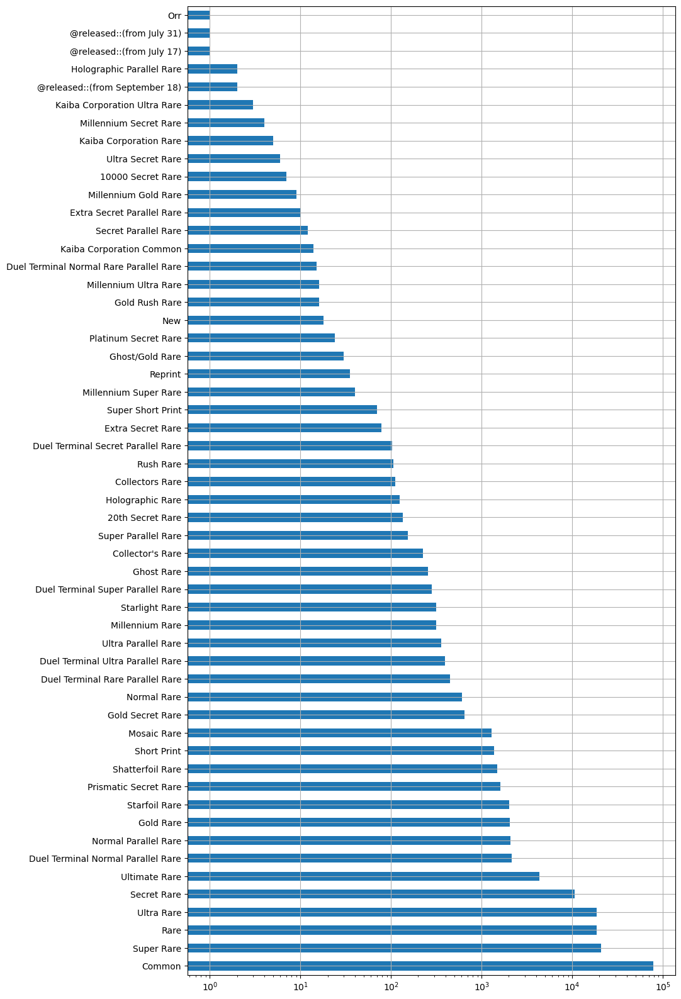

In [19]:
all_set_lists_df['Rarity'].explode().value_counts().plot.barh(figsize = (10,20), grid=True)
plt.xscale('log')
plt.show()

### By combination

In [20]:
all_set_lists_df.groupby('Rarity', dropna = False).nunique()

,Set,Card number,Name,Print,Quantity,Region,Release,Series,Set type,Cover card,Modification date,_merge
Rarity,,,,,,,,,,,,
"(10000 Secret Rare,)",2,7,1,1,0,7,2,1,1,2,2,1
"(20th Secret Rare,)",9,25,24,1,0,1,8,2,3,1,9,1
"(@released::(from July 17),)",1,1,1,0,0,1,0,0,0,0,1,1
"(@released::(from July 31),)",1,1,1,0,0,1,0,0,0,0,1,1
"(@released::(from September 18),)",1,2,1,0,0,1,0,0,0,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...
"(Ultra Rare, Ultimate Rare, Ultra Parallel Rare)",1,1,1,0,0,1,1,1,1,1,1,1
"(Ultra Rare, Ultra Parallel Rare)",22,71,67,0,0,1,16,3,2,16,21,2
"(Ultra Rare, Ultra Parallel Rare, Ultimate Rare)",5,5,5,0,0,1,3,2,1,3,5,1


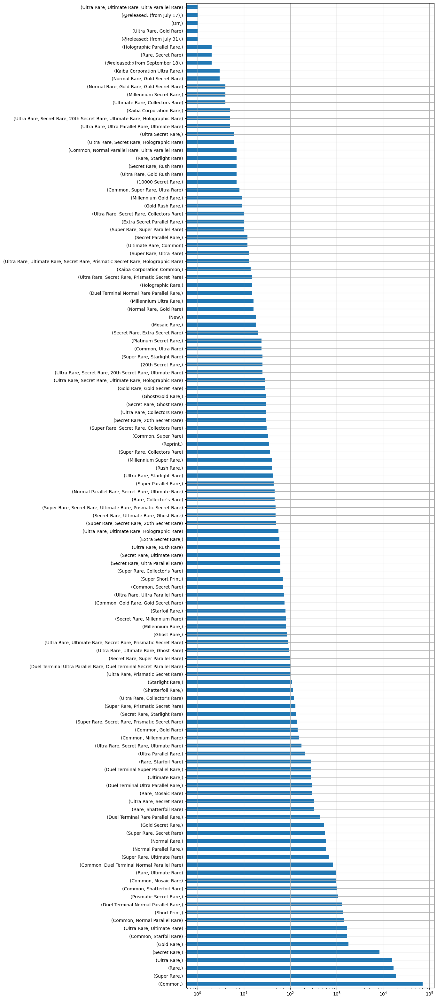

In [21]:
all_set_lists_df['Rarity'].value_counts().plot.barh(figsize = (10,40), grid=True)
plt.xscale('log')
plt.show()

## Print

In [22]:
print('Total number of prints:', all_set_lists_df['Print'].nunique())

Total number of prints: 18


In [23]:
all_set_lists_df.groupby('Print', dropna=False).nunique()

,Set,Card number,Name,Rarity,Quantity,Region,Release,Series,Set type,Cover card,Modification date,_merge
Print,,,,,,,,,,,,
,1,164,0,0,0,1,1,1,1,0,1,1
2,1,0,1,0,0,1,1,0,1,1,1,1
American debut,1,3,3,1,0,1,1,0,1,1,1,1
European & Oceanian debut,1,6,6,1,0,1,1,0,1,0,1,1
European debut,12,146,146,5,0,2,10,0,2,1,12,1
Functional errata,1,2,2,1,0,1,1,0,1,1,1,1
New,226,11560,3858,50,3,11,242,18,13,129,224,2
New art,1,4,2,1,0,2,2,0,1,1,1,1
New artwork,10,74,15,5,0,7,12,3,4,4,10,1


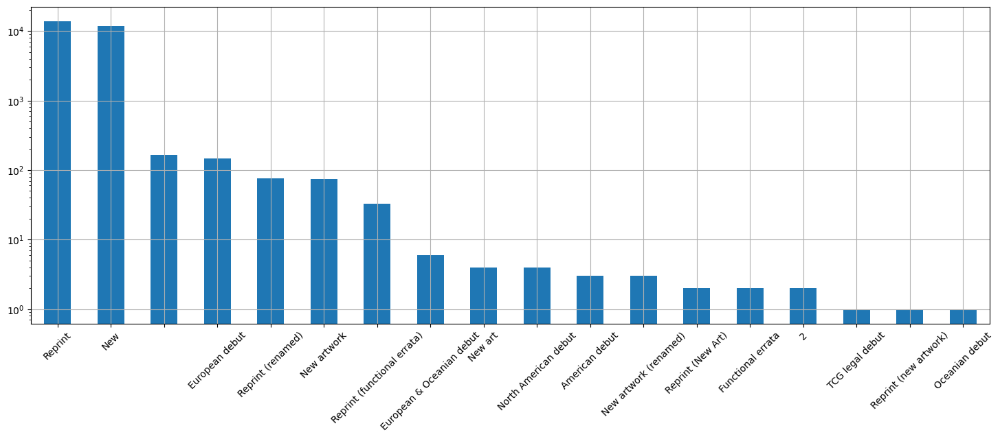

In [24]:
all_set_lists_df['Print'].value_counts().plot.bar(figsize = (18,6), grid=True, rot = 45)
plt.yscale('log')
plt.show()

## Quantity

In [25]:
print('Total number of quantities:', all_set_lists_df['Quantity'].nunique())

Total number of quantities: 3


In [26]:
all_set_lists_df.groupby('Quantity', dropna=False).nunique()

,Set,Card number,Name,Rarity,Print,Region,Release,Series,Set type,Cover card,Modification date,_merge
Quantity,,,,,,,,,,,,
1,67,8858,1215,11,2,11,108,1,6,46,66,2
2,66,855,173,4,2,11,108,1,6,45,65,2
3,10,74,25,1,2,8,12,0,4,8,10,1
<NA>,1373,141938,12462,123,18,17,1500,45,36,314,1365,3


## Region

In [27]:
print('Total number of regions:', all_set_lists_df['Region'].nunique())

Total number of regions: 17


In [28]:
all_set_lists_df.groupby('Region', dropna=False).nunique()

,Set,Card number,Name,Rarity,Print,Quantity,Release,Series,Set type,Cover card,Modification date,_merge
Region,,,,,,,,,,,,
AE,34,1527,1493,12,0,2,31,2,7,19,34,1
AU,2,100,87,3,0,0,0,0,1,2,2,1
DE,454,20312,10354,45,4,3,382,12,18,218,453,2
EN,657,20183,10480,51,14,3,535,22,23,207,656,2
ES,1,100,100,7,0,0,0,1,1,1,1,1
EU,25,543,456,8,3,0,15,2,9,6,25,1
FC,3,102,87,3,0,0,1,0,2,2,3,1
FR,448,19719,10341,46,4,3,376,14,18,218,447,2
IT,446,19991,10349,46,4,3,377,12,18,217,445,2


In [29]:
all_set_lists_df.groupby('Region', dropna=False).nunique().describe()

,Set,Card number,Name,Rarity,Print,Quantity,Release,Series,Set type,Cover card,Modification date,_merge
count,18.000000,18.000000,18.000000,18.00000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000
mean,215.055556,8462.611111,4805.722222,27.50000,3.055556,1.666667,176.111111,7.777778,10.166667,95.166667,214.222222,1.388889
std,252.650298,9273.573790,5007.093049,25.53717,3.489012,1.414214,203.743174,8.156957,8.759868,105.505088,251.558800,0.501631
min,1.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000
25%,4.000000,213.750000,210.250000,8.00000,0.000000,0.000000,3.500000,2.000000,2.000000,3.000000,4.000000,1.000000
50%,40.500000,1526.500000,1413.000000,12.00000,3.500000,2.000000,35.000000,5.000000,9.500000,15.500000,40.500000,1.000000
75%,438.250000,19097.500000,10347.000000,45.75000,4.000000,3.000000,370.750000,12.000000,17.750000,214.500000,437.250000,2.000000
max,718.000000,20312.000000,11205.000000,92.00000,14.000000,3.000000,535.000000,28.000000,28.000000,247.000000,713.000000,2.000000


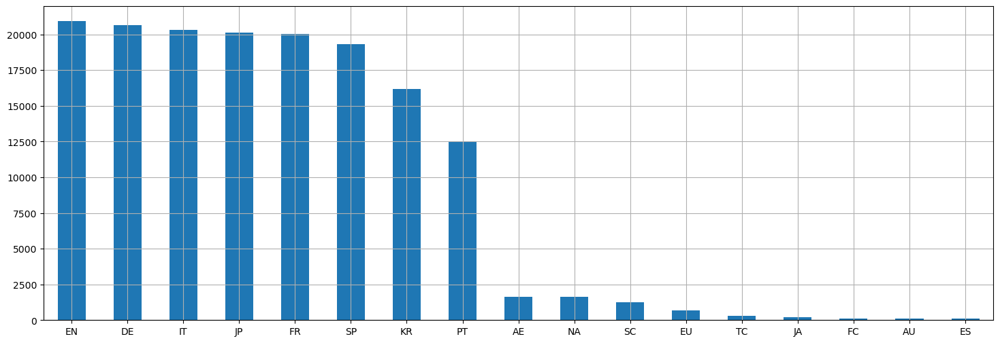

In [30]:
all_set_lists_df['Region'].value_counts().plot.bar(figsize = (18,6), grid=True, rot=0)
plt.show()

## Cover card

In [31]:
print('Total number of cover cards:', all_set_lists_df['Cover card'].explode('Cover card').nunique())

Total number of cover cards: 671


In [32]:
all_set_lists_df.explode('Cover card').groupby('Cover card').nunique()

,Set,Card number,Name,Rarity,Print,Quantity,Region,Release,Series,Set type,Modification date,_merge
Cover card,,,,,,,,,,,,
A-to-Z-Dragon Buster Cannon,1,352,54,4,2,2,8,4,0,1,1,1
Accel Synchro Stardust Dragon,1,100,50,3,2,0,2,2,0,1,1,1
Accesscode Talker,1,766,101,16,2,0,8,3,1,1,1,1
Adamancipator Risen - Dragite,1,135,45,3,2,0,3,3,0,1,1,1
"Adreus, Keeper of Armageddon",1,84,42,4,0,0,2,2,0,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...
Yamiterasu the Divine Delayer,1,132,66,6,0,0,2,2,1,1,1,1
"Yoko, the Graceful Mayakashi",2,450,60,4,2,0,8,3,0,1,2,1
Yubel - The Ultimate Nightmare,2,560,100,10,0,0,6,5,1,2,2,1


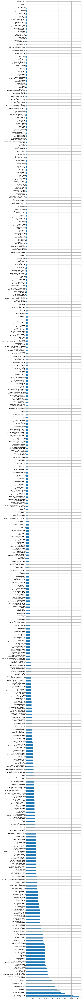

In [33]:
all_set_lists_df['Cover card'].explode().value_counts().plot.barh(figsize = (10,180), grid=True)
plt.show()

## Series

In [34]:
print('Total number of series:', all_set_lists_df['Series'].nunique())

Total number of series: 45


In [35]:
all_set_lists_df.groupby('Series').nunique()

,Set,Card number,Name,Rarity,Print,Quantity,Region,Release,Set type,Cover card,Modification date,_merge
Series,,,,,,,,,,,,
+1 Bonus Pack,7,249,137,3,0,0,2,12,1,0,7,1
Animation Chronicle,2,200,100,7,2,0,2,4,1,2,2,1
Astral Pack,7,1110,184,4,4,0,6,16,1,0,7,1
Attribute Duelist Pack,4,429,199,6,3,0,3,9,1,4,4,1
Battle Pack (Rush Duel),8,80,80,3,3,0,1,8,1,0,8,1
Booster (series),4,181,176,8,0,0,1,4,1,2,4,1
Booster pack,1,50,50,3,0,0,1,1,1,0,1,1
Champion Pack,8,640,161,4,2,0,4,8,1,0,8,1
Classic Pack,3,570,406,9,3,0,1,3,1,2,3,1


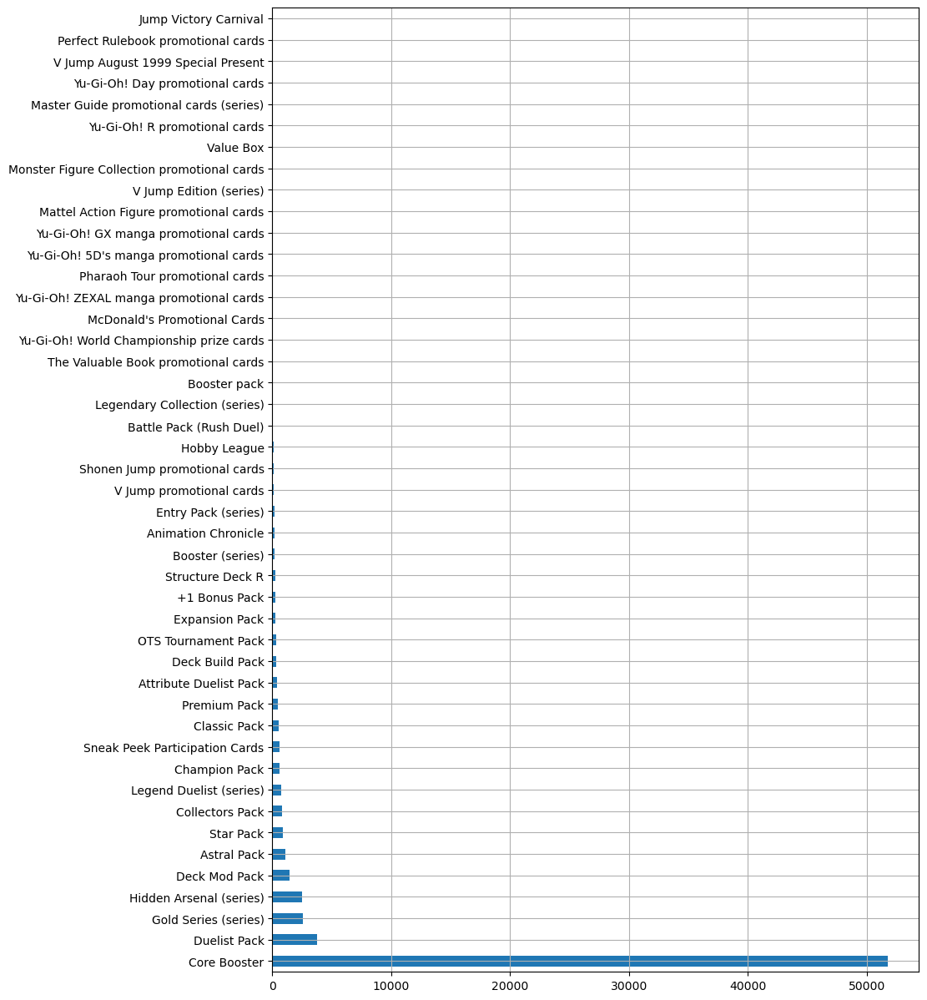

In [36]:
all_set_lists_df['Series'].value_counts().plot.barh(figsize = (10,15), grid=True)
plt.show()

## Set type

In [37]:
print('Total number of set types:', all_set_lists_df['Set type'].nunique())

Total number of set types: 37


In [38]:
all_set_lists_df.groupby('Set type').nunique()

,Set,Card number,Name,Rarity,Print,Quantity,Region,Release,Series,Cover card,Modification date,_merge
Set type,,,,,,,,,,,,
Beta set,1,535,106,1,0,2,5,1,0,0,1,1
Binder,2,6,6,2,2,0,1,2,0,0,2,1
Book promotional card,4,5,5,3,0,0,2,4,1,0,4,1
Book promotional cards,26,52,52,4,0,0,2,27,2,0,26,1
Booster pack,469,113732,11755,102,16,0,15,809,23,223,469,1
Boss Duel Deck,1,8,8,1,0,0,1,1,0,0,1,1
Bundle,9,11,11,3,0,0,1,7,1,0,9,1
Collectible tin,53,5901,1005,9,4,0,8,66,0,35,53,1
Collector's Set,11,6226,1102,7,2,3,7,14,0,6,11,1


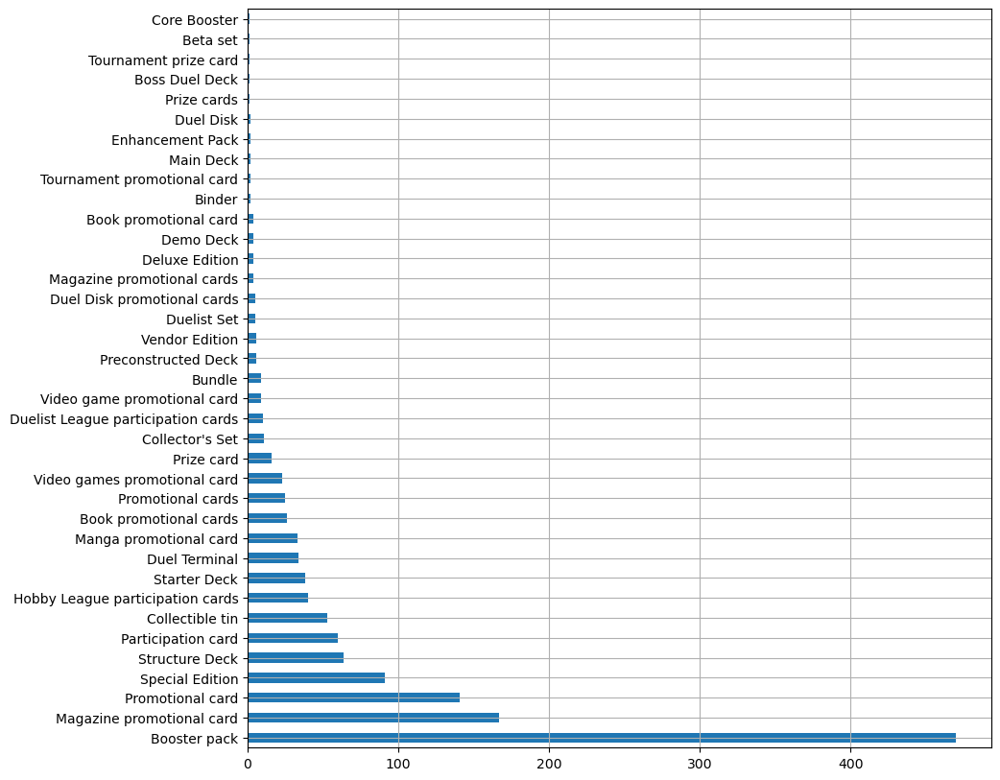

In [39]:
set_info_df['Set type'].value_counts().plot.barh(figsize = (10,10), grid=True)
plt.show()

## Release

In [40]:
print('Total number of release dates:', all_set_lists_df['Release'].nunique())

Total number of release dates: 1571


In [41]:
all_set_lists_df.groupby('Release', dropna=False).nunique()

,Set,Card number,Name,Rarity,Print,Quantity,Region,Series,Set type,Cover card,Modification date,_merge
Release,,,,,,,,,,,,
1999-03-01,1,0,40,1,0,0,1,1,1,0,1,1
1999-03-18,1,0,1,0,0,0,1,0,1,0,1,1
1999-04-29,1,0,1,0,0,0,1,0,1,0,1,1
1999-05-05,1,0,1,0,0,0,1,0,1,0,1,1
1999-05-25,1,0,40,1,0,0,1,1,1,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...
2023-01-21,1,67,60,7,0,0,1,1,1,1,1,1
2023-02-25,1,190,26,5,3,0,1,1,1,0,1,1
2023-03-01,3,2,3,2,0,0,1,0,1,0,3,1


In [42]:
set_by_release = pd.DataFrame(all_set_lists_df.groupby('Release', dropna=False)['Set'].nunique())

### By year

In [43]:
all_set_lists_df.drop('Modification date', axis=1).groupby('Release', dropna=False).nunique().groupby(set_by_release.index.strftime('%Y')).sum()

,Set,Card number,Name,Rarity,Print,Quantity,Region,Series,Set type,Cover card,_merge
Release,,,,,,,,,,,
1999,18,0,353,10,2,0,15,8,15,1,15
2000,11,268,318,21,2,2,9,7,10,4,9
2001,13,311,313,30,7,4,13,5,12,7,13
2002,24,1753,1292,84,8,2,25,9,21,16,20
2003,45,2596,1973,115,12,0,52,12,38,22,36
2004,79,5852,4165,190,6,0,108,27,69,31,59
2005,75,7826,4043,160,27,18,127,28,64,37,49
2006,102,5244,3048,186,22,20,125,39,93,42,67
2007,127,5747,3347,273,16,18,192,53,116,54,94


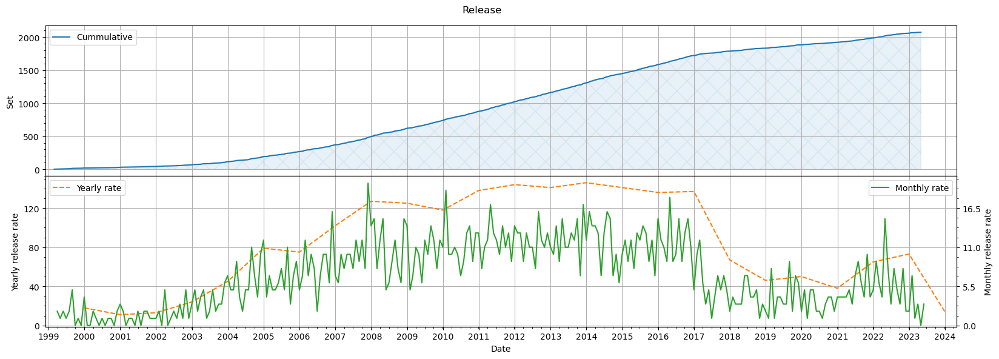

In [44]:
rate_plot(set_by_release)

### By month

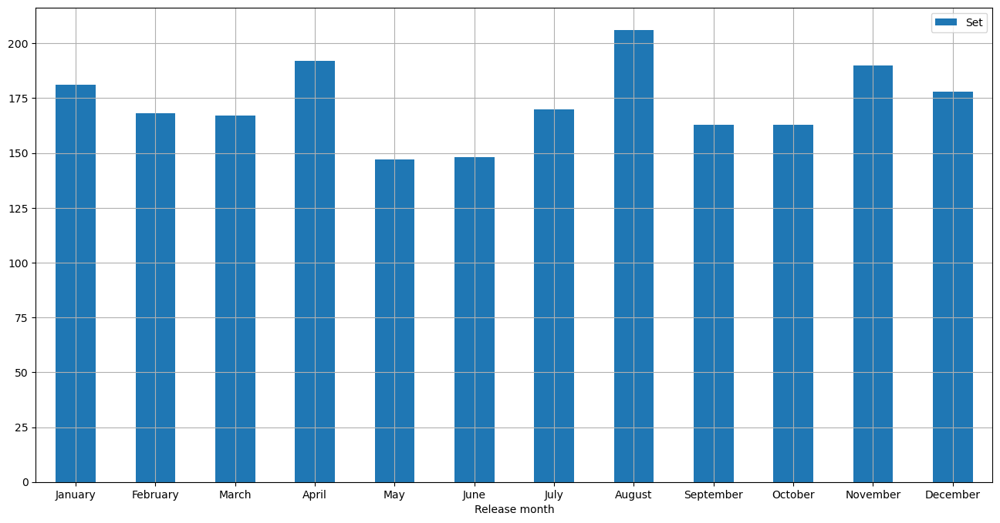

In [45]:
set_by_release.groupby(set_by_release.index.strftime('%B')).sum().sort_index(key=lambda x: pd.to_datetime(x, format='%B').month).plot.bar(figsize= (16,8), grid=True, xlabel = 'Release month', rot = 0)
plt.show()

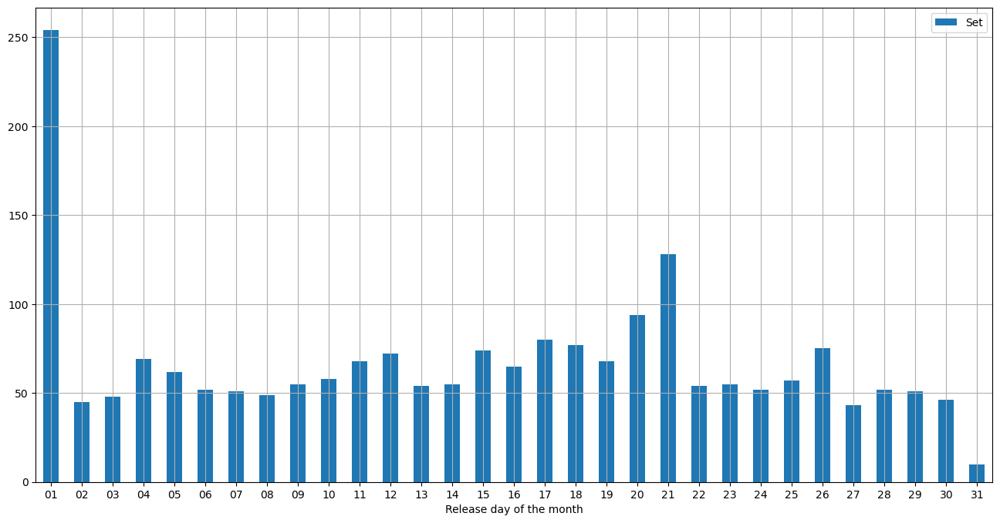

In [46]:
set_by_release.groupby(set_by_release.index.strftime('%d')).sum().plot.bar(figsize= (16,8), grid=True, xlabel = 'Release day of the month', rot = 0)
plt.show()

### By day

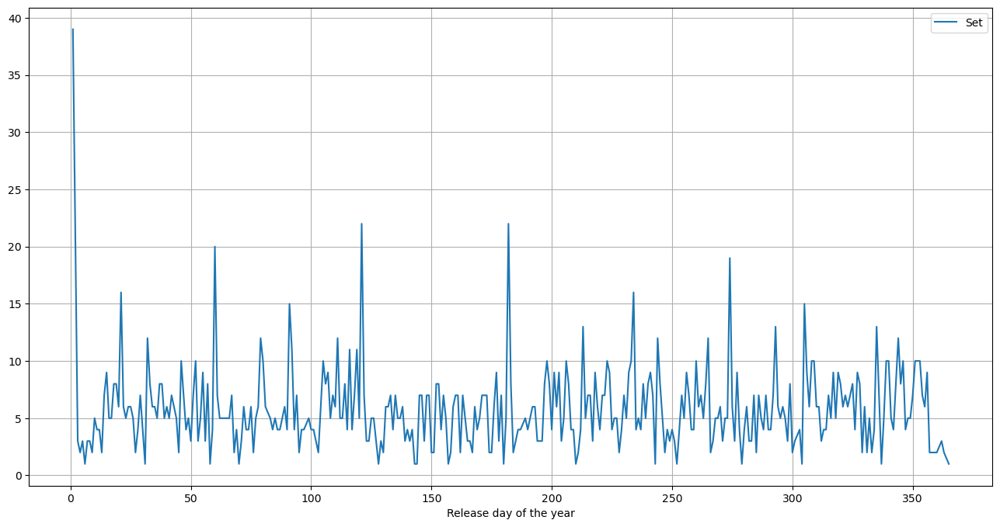

In [47]:
set_by_release.groupby(set_by_release.index.dayofyear).sum().plot(figsize= (16,8), grid=True, xlabel = 'Release day of the year')
plt.show()

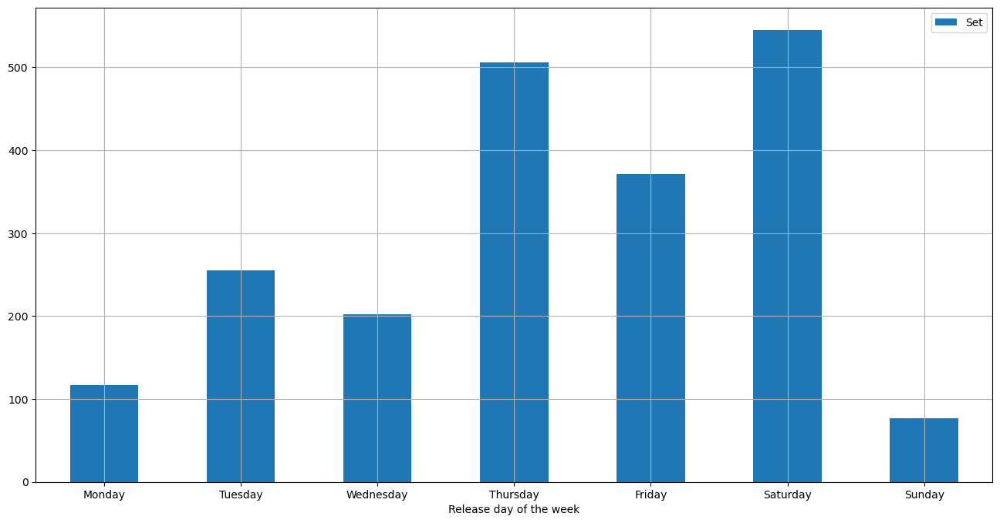

In [48]:
set_by_release_wd = set_by_release.groupby(set_by_release.index.weekday).sum()
set_by_release_wd.index = [calendar.day_name[i] for i in set_by_release_wd.index.astype(int)]
set_by_release_wd.plot.bar(figsize= (16,8), grid=True, xlabel = 'Release day of the week', rot = 0)
plt.show()

### By region

In [49]:
by_release_region = all_set_lists_df.groupby(['Region','Release']).nunique()
by_release_region

Set  Card number  Name  Rarity  Print  Quantity  Series  \
Region Release                                                               
AE     2001-06-04    1            0     2       0      0         0       0   
       2002-08-08    2          100    87       3      0         0       0   
       2002-10-24    1          144   144       5      0         0       1   
       2003-04-17    1            3     3       1      0         0       0   
       2003-06-26    1          105   105       5      0         0       1   
...                ...          ...   ...     ...    ...       ...     ...   
TC     2014-01-29    1           40    40       4      0         2       0   
       2014-05-01    1           20    20       4      0         0       1   
       2015-03-01    2           40    26       1      0         0       0   
       2015-08-29    1          100   100       6      0         0       1   
       2015-12-05    1          100   100       6      0         0       1   

                   Set type  Cover card  Modification date  _merge  
Region Release                                                      
AE     2001-06-04         0           0                  1       1  
       2002-08-08         1           2                  2       1  
       2002-10-24         1           1                  1       1  
       2003-04-17         1           0                  1       1  
       2003-06-26         1           1                  1       1  
...                     ...         ...                ...     ...  
TC     2014-01-29         1           1                  1       1  
       2014-05-01         1           0                  1       1  
       2015-03-01         0           0                  2       1  
       2015-08-29         1           1                  1       1  
       2015-12-05         1           1                  1       1  

[3170 rows x 11 columns]

In [50]:
set_by_release_region = by_release_region['Set'].unstack(0).sort_index().fillna(0).astype(int)
set_by_release_region_y = set_by_release_region.groupby(set_by_release_region.index.strftime('%Y')).sum().T
set_by_release_region_y

Release,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,...,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
Region,,,,,,,,,,,,,,,,,,,,,
AE,0,0,1,3,4,3,3,5,2,1,...,1,1,0,0,0,0,0,0,0,0
DE,0,0,0,2,8,19,22,17,31,27,...,30,27,28,20,15,13,10,8,7,0
EN,0,0,2,2,3,16,29,48,50,45,...,43,34,35,20,15,13,10,12,11,1
EU,0,0,0,0,2,4,0,0,0,2,...,2,2,1,0,0,0,0,0,0,0
FC,0,0,0,0,2,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
FR,0,0,0,2,6,18,22,17,31,27,...,28,27,28,19,15,13,10,8,7,0
IT,0,0,0,2,5,18,21,17,31,27,...,28,27,28,20,15,13,10,8,7,0
JA,0,0,0,0,0,0,0,0,0,0,...,3,0,0,0,0,0,0,0,0,0
JP,18,11,10,11,11,20,24,27,33,41,...,43,43,52,14,16,20,14,25,26,10


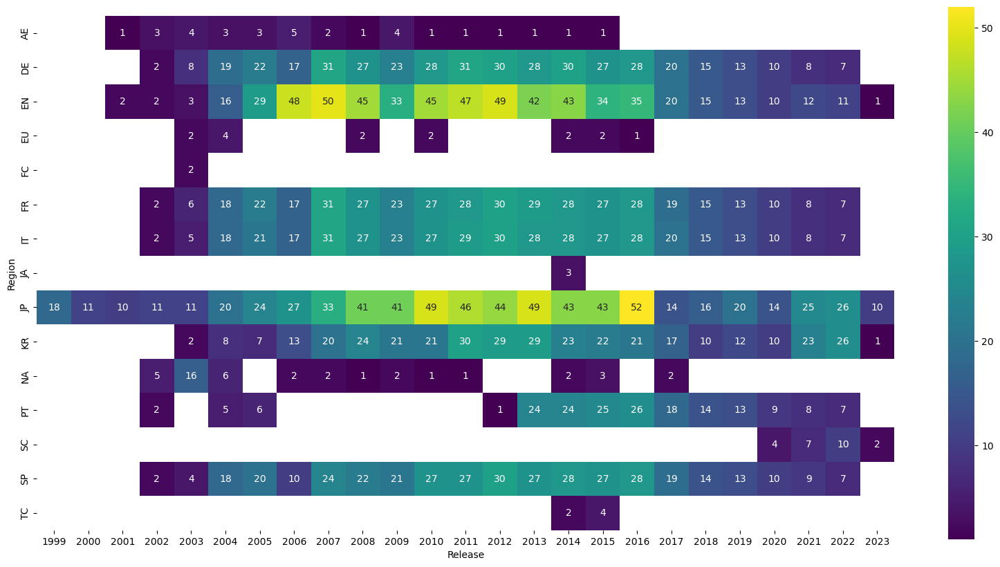

In [51]:
plt.figure(figsize = (20,10))
sns.heatmap(set_by_release_region_y[set_by_release_region_y>0], annot=True, fmt='g', cmap='viridis', square=True)
plt.show()

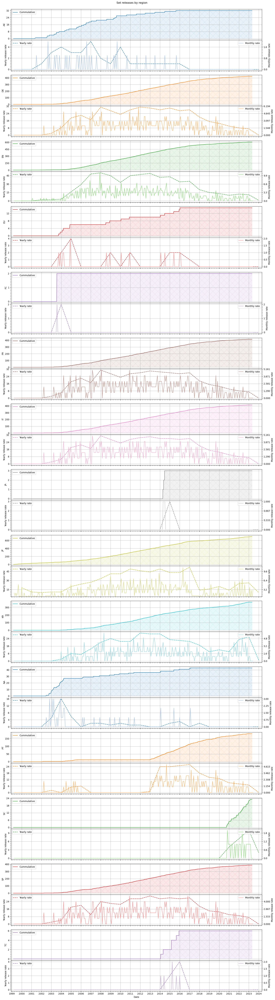

In [52]:
rate_subplots(set_by_release_region, title='Set releases')

### By series

In [53]:
by_release_series = all_set_lists_df.explode('Series').groupby(['Series','Release']).nunique()
by_release_series

Set  Card number  Name  \
Series                                  Release                              
+1 Bonus Pack                           2020-10-31    1           19    19   
                                        2021-02-04    1           20    20   
                                        2021-04-17    1           19    19   
                                        2021-07-17    1           19    19   
                                        2021-07-21    1           19    19   
...                                                 ...          ...   ...   
Yu-Gi-Oh! ZEXAL manga promotional cards 2015-09-01    1            1     1   
                                        2015-10-03    1            1     1   
                                        2015-12-18    1            1     1   
                                        2016-03-01    1            1     1   
                                        2016-09-06    1            1     1   

                                                    Rarity  Print  Quantity  \
Series                                  Release                               
+1 Bonus Pack                           2020-10-31       3      0         0   
                                        2021-02-04       3      0         0   
                                        2021-04-17       3      0         0   
                                        2021-07-17       3      0         0   
                                        2021-07-21       3      0         0   
...                                                    ...    ...       ...   
Yu-Gi-Oh! ZEXAL manga promotional cards 2015-09-01       1      0         0   
                                        2015-10-03       1      0         0   
                                        2015-12-18       1      0         0   
                                        2016-03-01       1      0         0   
                                        2016-09-06       1      0         0   

                                                    Region  Set type  \
Series                                  Release                        
+1 Bonus Pack                           2020-10-31       1         1   
                                        2021-02-04       1         1   
                                        2021-04-17       1         1   
                                        2021-07-17       1         1   
                                        2021-07-21       1         1   
...                                                    ...       ...   
Yu-Gi-Oh! ZEXAL manga promotional cards 2015-09-01       1         1   
                                        2015-10-03       1         1   
                                        2015-12-18       1         1   
                                        2016-03-01       1         1   
                                        2016-09-06       1         1   

                                                    Cover card  \
Series                                  Release                  
+1 Bonus Pack                           2020-10-31           0   
                                        2021-02-04           0   
                                        2021-04-17           0   
                                        2021-07-17           0   
                                        2021-07-21           0   
...                                                        ...   
Yu-Gi-Oh! ZEXAL manga promotional cards 2015-09-01           0   
                                        2015-10-03           0   
                                        2015-12-18           0   
                                        2016-03-01           0   
                                        2016-09-06           0   

                                                    Modification date  _merge  
Series                                  Release                                
+1 Bonus Pack                           2020-10-31   

In [54]:
set_by_release_series = by_release_series['Set'].unstack(0).sort_index().fillna(0).astype(int)
set_by_release_series_y = set_by_release_series.groupby(set_by_release_series.index.strftime('%Y')).sum().T
set_by_release_series_y

Release,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,...,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
Series,,,,,,,,,,,,,,,,,,,,,
+1 Bonus Pack,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,6,4,1
Animation Chronicle,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,2,2,0
Astral Pack,0,0,0,0,0,0,0,0,0,0,...,8,3,0,0,0,0,0,0,0,0
Attribute Duelist Pack,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,2,3,4,0
Battle Pack (Rush Duel),0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,3,4,1
Booster (series),0,3,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Booster pack,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Champion Pack,0,0,0,0,0,0,0,1,3,3,...,0,0,0,0,0,0,0,0,0,0
Classic Pack,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,2,1


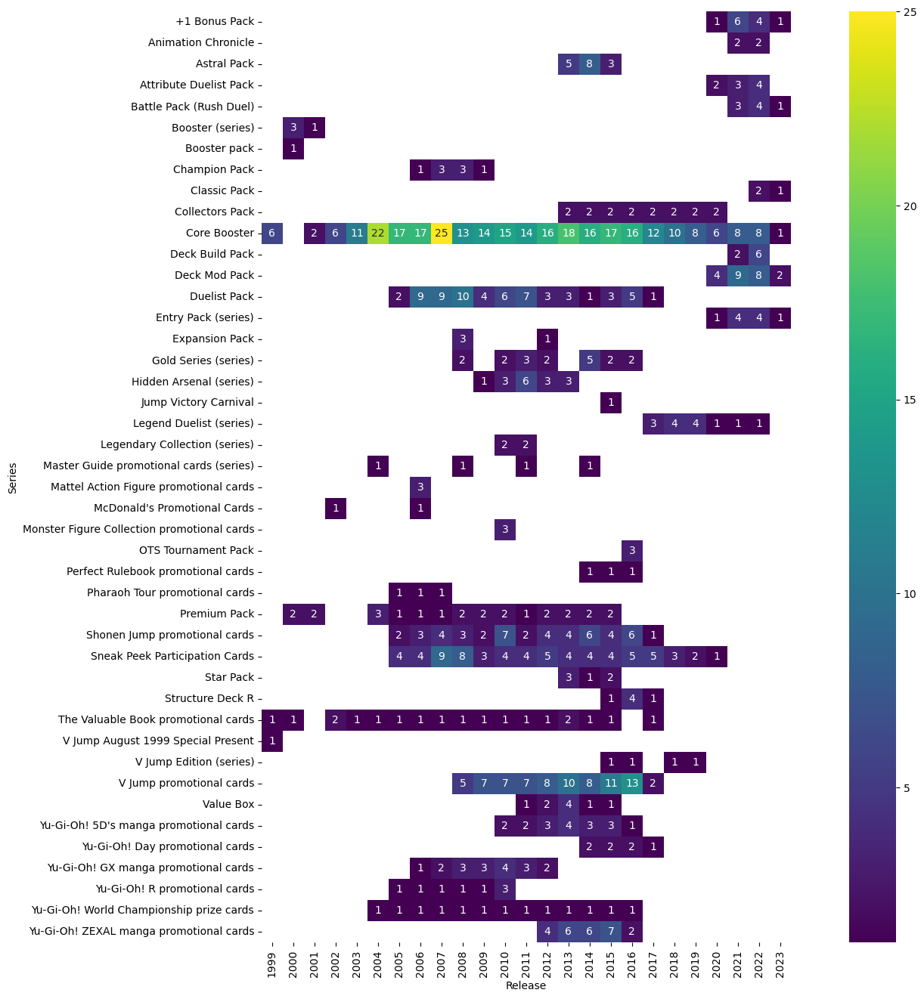

In [55]:
plt.figure(figsize = (20,16))
sns.heatmap(set_by_release_series_y[set_by_release_series_y>0], annot=True, fmt='g', cmap='viridis', square=True)
plt.show()

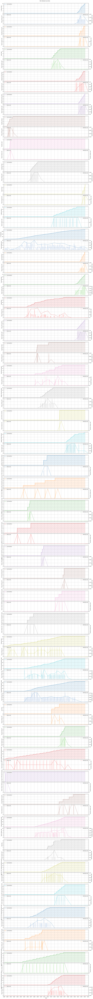

In [56]:
rate_subplots(set_by_release_series, title='Set releases')

### By set type

In [57]:
by_release_type = all_set_lists_df.explode('Set type').groupby(['Set type','Release']).nunique()
by_release_type

Set  Card number  Name  Rarity  \
Set type                     Release                                      
Beta set                     2017-10-04    1          535   106       1   
Binder                       2012-09-21    1            3     3       1   
                             2015-04-29    1            3     3       1   
Book promotional card        2004-12-18    1            2     2       1   
                             2014-04-04    1            1     1       1   
...                                      ...          ...   ...     ...   
Video games promotional card 2011-04-28    1            7     7       1   
                             2011-05-10    1            3     3       1   
                             2013-12-05    1            3     3       1   
                             2014-06-26    1           15     3       1   
                             2016-07-16    1            1     1       1   

                                         Print  Quantity  Region  Series  \
Set type                     Release                                       
Beta set                     2017-10-04      0         2       5       0   
Binder                       2012-09-21      2         0       1       0   
                             2015-04-29      0         0       1       0   
Book promotional card        2004-12-18      0         0       1       0   
                             2014-04-04      0         0       1       1   
...                                        ...       ...     ...     ...   
Video games promotional card 2011-04-28      0         0       1       0   
                             2011-05-10      0         0       1       0   
                             2013-12-05      0         0       1       0   
                             2014-06-26      0         0       5       0   
                             2016-07-16      0         0       1       0   

                                         Cover card  Modification date  _merge  
Set type                     Release                                            
Beta set                     2017-10-04           0                  1       1  
Binder                       2012-09-21           0                  1       1  
                             2015-04-29           0                  1       1  
Book promotional card        2004-12-18           0                  1       1  
                             2014-04-04           0                  1       1  
...                                             ...                ...     ...  
Video games promotional card 2011-04-28           0                  1       1  
                             2011-05-10           0                  1       1  
                             2013-12-05           0                  1       1  
                             2014-06-26           0                  1       1  
                             2016-07-16           0                  1       1  

[1859 rows x 11 columns]

In [58]:
set_by_release_type = by_release_type['Set'].unstack(0).sort_index().fillna(0).astype(int)
set_by_release_type_y = set_by_release_type.groupby(set_by_release_type.index.strftime('%Y')).sum().T
set_by_release_type_y

Release,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,...,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
Set type,,,,,,,,,,,,,,,,,,,,,
Beta set,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
Binder,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
Book promotional card,0,0,0,0,0,1,0,0,0,0,...,1,1,1,0,0,0,0,0,0,0
Book promotional cards,1,2,0,2,1,2,1,1,1,2,...,2,2,1,1,0,0,0,0,0,0
Booster pack,6,6,5,10,15,40,34,36,44,44,...,65,56,52,38,28,31,31,52,53,8
Boss Duel Deck,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
Bundle,0,0,0,0,0,0,0,0,0,0,...,1,1,0,0,0,0,0,0,0,0
Collectible tin,0,0,0,1,2,2,2,3,3,7,...,2,2,2,2,1,2,1,1,1,0
Collector's Set,0,0,0,0,0,0,0,0,0,0,...,0,2,2,0,0,3,2,1,4,0


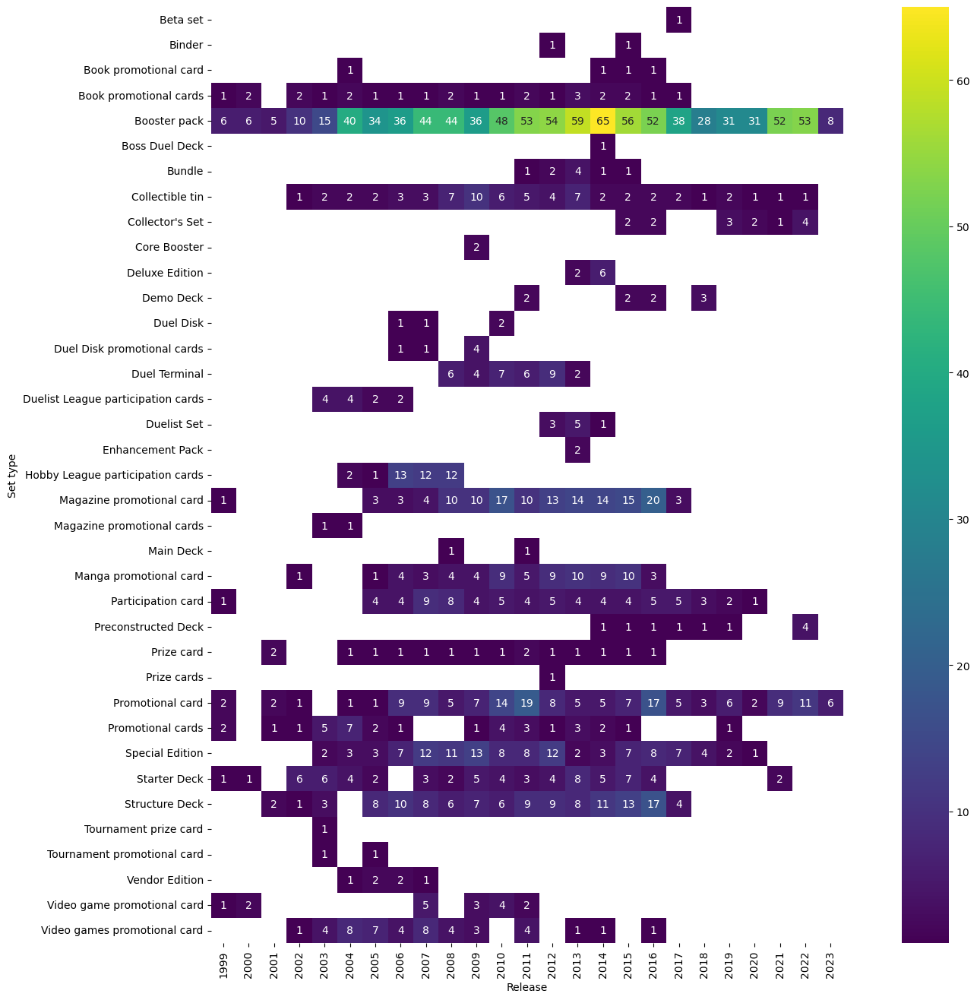

In [59]:
plt.figure(figsize = (20,16))
sns.heatmap(set_by_release_type_y[set_by_release_type_y>0], annot=True, fmt='g', cmap='viridis', square=True)
plt.show()

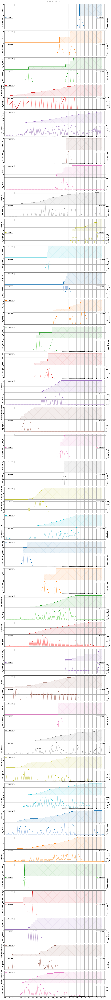

In [60]:
rate_subplots(set_by_release_type, title='Set releases')

# Debug

This section is used for debugging the extraction of data from MediaWiki query responses

## Has nan name/number

In [61]:
all_set_lists_df[all_set_lists_df['Name'].isna() | all_set_lists_df['Card number'].isna()]

,Set,Card number,Name,Rarity,Print,Quantity,Region,Release,Series,Set type,Cover card,Modification date,_merge
10913,Booster 4,<NA>,The Wicked Worm Beast,"(Common,)",<NA>,<NA>,JP,1999-08-26,Core Booster,Booster pack,NaN,2022-07-23 09:59:12,both
10914,Booster 4,<NA>,Big Insect,"(Common,)",<NA>,<NA>,JP,1999-08-26,Core Booster,Booster pack,NaN,2022-07-23 09:59:12,both
10915,Booster 4,<NA>,Fiend Kraken,"(Common,)",<NA>,<NA>,JP,1999-08-26,Core Booster,Booster pack,NaN,2022-07-23 09:59:12,both
10916,Booster 4,<NA>,Axe Raider,"(Common,)",<NA>,<NA>,JP,1999-08-26,Core Booster,Booster pack,NaN,2022-07-23 09:59:12,both
10917,Booster 4,<NA>,Faith Bird,"(Common,)",<NA>,<NA>,JP,1999-08-26,Core Booster,Booster pack,NaN,2022-07-23 09:59:12,both
...,...,...,...,...,...,...,...,...,...,...,...,...,...
144883,EX Starter Box,<NA>,De-Spell,None,2,<NA>,JP,1999-12-16,<NA>,Starter Deck,"(Blue-Eyes White Dragon,)",2022-05-01 06:51:59,both
144884,EX Starter Box,<NA>,Castle Walls,None,Reprint,<NA>,JP,1999-12-16,<NA>,Starter Deck,"(Blue-Eyes White Dragon,)",2022-05-01 06:51:59,both
144885,EX Starter Box,<NA>,Ultimate Offering,None,Reprint,<NA>,JP,1999-12-16,<NA>,Starter Deck,"(Blue-Eyes White Dragon,)",2022-05-01 06:51:59,both
155890,Academia Disk,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaT,<NA>,<NA>,NaN,2022-12-28 20:46:20,right_only


## Has nan rarity

In [62]:
all_set_lists_df.explode('Rarity')[all_set_lists_df.explode('Rarity')['Rarity'].isna()]['Set'].unique()

array(['Dark Beginning 2', 'Dark Revelation Volume 1',
       'Dark Revelation Volume 2', 'Advanced Event Pack 2014 Vol.1',
       'Yu-Gi-Oh! Duel Monsters II: Dark duel Stories Duelist Legend in Tokyo Dome attendance cards',
       'Yu-Gi-Oh! True Duel Monsters: Sealed Memories promotional cards',
       'Advanced Tournament Pack 2013 Vol.3', 'Dark Beginning 1',
       'Yu-Gi-Oh! Duel Monsters II: Dark duel Stories Duelist Legend in Tokyo Dome invitation cards',
       'V Jump April 2013 Tokens',
       'Yu-Gi-Oh! Duel Monsters II: Dark duel Stories Duelist Legend in Tokyo Dome prize cards',
       'Advanced Tournament Pack 2013 Vol.4',
       'Official Guide Starter Book promotional card',
       'Starter Box pre-order promotional card',
       'Duel Monsters II tournament meeting experience promotional card',
       'Advanced Event Pack 2013 Vol.2',
       'The Valuable Book 1 promotional cards', 'Jump Festa 2000',
       'Yu-Gi-Oh! Duel Monsters II: Dark duel Stories Duelist Legend

## Has quantity as print

In [63]:
all_set_lists_df[all_set_lists_df['Print']=='2']

,Set,Card number,Name,Rarity,Print,Quantity,Region,Release,Series,Set type,Cover card,Modification date,_merge
144834,EX Starter Box,<NA>,De-Spell,None,2,<NA>,JP,1999-12-16,<NA>,Starter Deck,"(Blue-Eyes White Dragon,)",2022-05-01 06:51:59,both
144883,EX Starter Box,<NA>,De-Spell,None,2,<NA>,JP,1999-12-16,<NA>,Starter Deck,"(Blue-Eyes White Dragon,)",2022-05-01 06:51:59,both


In [64]:
all_set_lists_df[all_set_lists_df['Set']=='EX Starter Box']

,Set,Card number,Name,Rarity,Print,Quantity,Region,Release,Series,Set type,Cover card,Modification date,_merge
144786,EX Starter Box,<NA>,Lord of D.,"(New,)",<NA>,<NA>,JP,1999-12-16,<NA>,Starter Deck,"(Blue-Eyes White Dragon,)",2022-05-01 06:51:59,both
144787,EX Starter Box,<NA>,The Flute of Summoning Dragon,"(New,)",<NA>,<NA>,JP,1999-12-16,<NA>,Starter Deck,"(Blue-Eyes White Dragon,)",2022-05-01 06:51:59,both
144788,EX Starter Box,<NA>,Dark Magician,None,<NA>,<NA>,JP,1999-12-16,<NA>,Starter Deck,"(Blue-Eyes White Dragon,)",2022-05-01 06:51:59,both
144789,EX Starter Box,<NA>,Mystical Elf,None,<NA>,<NA>,JP,1999-12-16,<NA>,Starter Deck,"(Blue-Eyes White Dragon,)",2022-05-01 06:51:59,both
144790,EX Starter Box,<NA>,Feral Imp,None,<NA>,<NA>,JP,1999-12-16,<NA>,Starter Deck,"(Blue-Eyes White Dragon,)",2022-05-01 06:51:59,both
...,...,...,...,...,...,...,...,...,...,...,...,...,...
144881,EX Starter Box,<NA>,Reverse Trap,None,Reprint,<NA>,JP,1999-12-16,<NA>,Starter Deck,"(Blue-Eyes White Dragon,)",2022-05-01 06:51:59,both
144882,EX Starter Box,<NA>,Remove Trap,None,Reprint,<NA>,JP,1999-12-16,<NA>,Starter Deck,"(Blue-Eyes White Dragon,)",2022-05-01 06:51:59,both
144883,EX Starter Box,<NA>,De-Spell,None,2,<NA>,JP,1999-12-16,<NA>,Starter Deck,"(Blue-Eyes White Dragon,)",2022-05-01 06:51:59,both
144884,EX Starter Box,<NA>,Castle Walls,None,Reprint,<NA>,JP,1999-12-16,<NA>,Starter Deck,"(Blue-Eyes White Dragon,)",2022-05-01 06:51:59,both


## Has nan release

In [65]:
all_set_lists_df[all_set_lists_df['Release'].isna()]['Set'].unique()

array(['Astral Pack One', 'Starter Deck: Kaiba', 'Starter Deck: Pegasus',
       'Ancient Prophecy Sneak Peek Participation Card',
       'Hobby League 7 participation card D',
       'Shonen Jump Vol. 10, Issue 1 promotional card',
       'Invasion: Vengeance Sneak Peek Participation Card',
       'Shadow Specters Sneak Peek Participation Card',
       'Yu-Gi-Oh! Worldwide Edition: Stairway to the Destined Duel promotional cards',
       'Shonen Jump Vol. 7, Issue 6 promotional card',
       'Starter Deck: Yugi', 'Curse of Anubis',
       'Yu-Gi-Oh! GX Volume 4 promotional card',
       'Crossed Souls Sneak Peek Participation Card',
       'Hobby League 6 participation card E', 'Spell Ruler',
       'Ancient Sanctuary',
       'Legacy of the Valiant Sneak Peek Participation Card',
       'Millennium Pack', 'National Championship 2011',
       'Shonen Jump Vol. 4, Issue 11 promotional card',
       'The New Challengers Sneak Peek Participation Card',
       'Tournament Pack 2009 Vol.3'

## Has print as rarity

In [66]:
all_set_lists_df.explode('Rarity')[(all_set_lists_df['Rarity'].explode() == 'New') | (all_set_lists_df['Rarity'].explode() == 'Reprint')]['Set'].unique()

array(['Booster 4', 'Booster 5', 'Booster 6', 'Booster 7',
       'Structure Deck R: Machine Dragon Re-Volt',
       'Dark Ceremony Edition', 'Booster 1', 'EX Starter Box'],
      dtype=object)

## Merge failed

In [67]:
all_set_lists_df[all_set_lists_df['_merge']=='right_only']

,Set,Card number,Name,Rarity,Print,Quantity,Region,Release,Series,Set type,Cover card,Modification date,_merge
155890,Academia Disk,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaT,<NA>,<NA>,NaN,2022-12-28 20:46:20,right_only
155891,Structure Deck: Marik (disambiguation),<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaT,<NA>,<NA>,NaN,2014-07-03 18:52:14,right_only


In [68]:
len(all_set_lists_df[all_set_lists_df['_merge']=='left_only']['Set'].unique())

8

In [69]:
all_set_lists_df['Set'].unique()

array(['2-Player Starter Deck: Yuya & Declan', '2014 Mega-Tins',
       '2016 Mega-Tins', ..., 'Jump Festa 2010 - Promotion Pack',
       'Academia Disk', 'Structure Deck: Marik (disambiguation)'],
      dtype=object)

In [70]:
all_set_lists_df[all_set_lists_df['Set'].str.contains("Marik")].dropna()

,Set,Card number,Name,Rarity,Print,Quantity,Region,Release,Series,Set type,Cover card,Modification date,_merge


# HTML export

In [71]:
# May need to sleep for a few seconds after saving
save_notebook()

Notebook saved to disk


In [72]:
! jupyter nbconvert Sets.ipynb --output-dir='../' --to=HTML --TagRemovePreprocessor.enabled=True --TagRemovePreprocessor.remove_cell_tags='exclude' --TemplateExporter.exclude_input=True --TemplateExporter.exclude_input_prompt=True --TemplateExporter.exclude_output_prompt=True

[NbConvertApp] Converting notebook Sets.ipynb to HTML


[NbConvertApp] Writing 14974700 bytes to ../Sets.html


# Git

In [ ]:
! git add "../*[Ss]ets[._]*"

In [ ]:
! git commit -m {"'Sets update-" + timestamp.strftime("%d%m%Y")+"'"}